<a href="https://colab.research.google.com/github/aaubs/ds-master/blob/main/notebooks/M1_GeoPandas_Exercises.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install geopandas -q
!pip install contextily -q
!pip install geoplot -q


     |████████████████████████████████| 1.0 MB 3.9 MB/s 
     |████████████████████████████████| 16.7 MB 40.5 MB/s 
     |████████████████████████████████| 6.3 MB 47.2 MB/s 
     |████████████████████████████████| 55 kB 2.2 MB/s 
     |████████████████████████████████| 19.3 MB 1.2 MB/s 
     |████████████████████████████████| 10.8 MB 6.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 36.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 38.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 38.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 41.7 MB/s 
  Installing build dependencies ... done
  Getting requirement

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
from shapely.geometry import Point
import geoplot.crs as gcrs
import geoplot as gplt
import pyproj
import folium
from folium import Marker
from folium.plugins import MarkerCluster

In [ ]:
# ! pip install -q kaggle
#  ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json

# 1. Get the data

Use the next cell to load the shapefile located at loans_filepath to create a GeoDataFrame world_loans.

In [ ]:
loans_filepath = "/content/kiva_loans.shp"

# Your code here: Load the data
world_loans = gpd.read_file(loans_filepath)

# 2. Plot the data

Run the next code cell without changes to load a GeoDataFrame world containing country boundaries.

In [ ]:
# This dataset is provided in GeoPandas
world_filepath = gpd.datasets.get_path('naturalearth_lowres')
world = gpd.read_file(world_filepath)
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [ ]:
world_loans.explore()

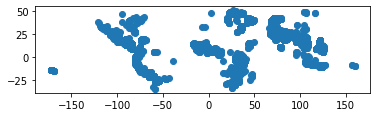

In [ ]:
world_loans.plot()

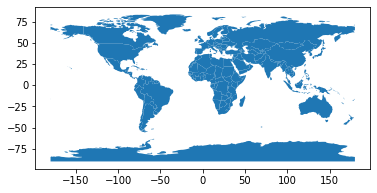

In [ ]:
world.plot()

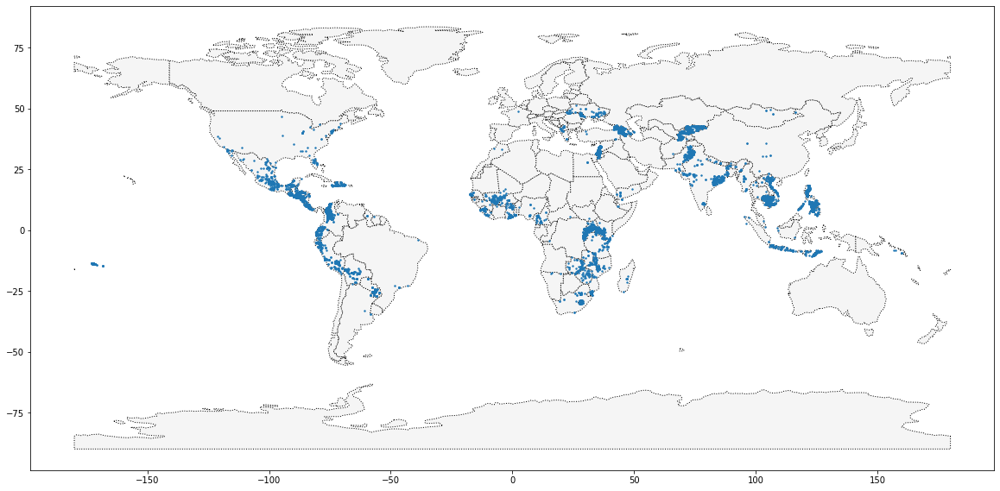

In [ ]:
# Your code here
ax = world.plot(figsize=(20,20), color='whitesmoke', linestyle=':', edgecolor='black')
world_loans.plot(ax=ax, markersize=2)

In [ ]:
# Your code here
# world.explore()


# 3. Select loans based in the Philippines

Next, you'll focus on loans that are based in the Philippines. Use the next code cell to create a GeoDataFrame PHL_loans which contains all rows from world_loans with loans that are based in the Philippines.


In [ ]:
world_loans

,Partner ID,Field Part,sector,Loan Theme,country,amount,geometry
0,9,KREDIT Microfinance Institution,General Financial Inclusion,Higher Education,Cambodia,450,POINT (102.89751 13.66726)
1,9,KREDIT Microfinance Institution,General Financial Inclusion,Vulnerable Populations,Cambodia,20275,POINT (102.98962 13.02870)
2,9,KREDIT Microfinance Institution,General Financial Inclusion,Higher Education,Cambodia,9150,POINT (102.98962 13.02870)
3,9,KREDIT Microfinance Institution,General Financial Inclusion,Vulnerable Populations,Cambodia,604950,POINT (105.31312 12.09829)
4,9,KREDIT Microfinance Institution,General Financial Inclusion,Sanitation,Cambodia,275,POINT (105.31312 12.09829)
...,...,...,...,...,...,...,...
13657,539,"N/A, direct to Sevamob",DSE Direct,Health,South Africa,50000,POINT (29.60355 -25.94599)
13658,540,"N/A, direct to Sanergy",DSE Direct,Water and Sanitation,Kenya,50000,POINT (36.82195 -1.29207)
13659,542,N/A direct to BioLite Inc.,DSE Direct,Clean Cookstove,Uganda,50000,POINT (32.58252 0.34760)
13660,543,N/A direct to LegWorks Inc.,DSE Direct,Health,Canada,50000,POINT (-79.38318 43.65323)


In [ ]:
world_loans.country=="Philippines"

0        False
1        False
2        False
3        False
4        False
         ...  
13657    False
13658    False
13659    False
13660    False
13661    False
Name: country, Length: 13662, dtype: bool

In [ ]:
PHL_loans =  world_loans[world_loans['country']=="Philippines"]

In [ ]:
# Your code here
# PHL_loans = world_loans.loc[world_loans.country=="Philippines"].copy()
PHL_loans.shape

(3083, 7)

In [ ]:
world_loans.country.value_counts().nlargest()

Philippines    3083
Armenia         942
Colombia        822
Mexico          615
Kenya           568
Name: country, dtype: int64

# 4. Understand loans in the Philippines.

Run the next code cell without changes to load a GeoDataFrame PHL containing boundaries for all islands in the Philippines.

In [ ]:
# Load a KML file containing island boundaries
gpd.io.file.fiona.drvsupport.supported_drivers['KML'] = 'rw'
PHL = gpd.read_file("https://github.com/aaubs/ds-master/blob/main/data/geopandas_data/Philippines_AL258.kml?raw=true", driver='KML')
PHL.head()

,Name,Description,geometry
0,Autonomous Region in Muslim Mindanao,,"MULTIPOLYGON (((119.46690 4.58718, 119.46653 4..."
1,Bicol Region,,"MULTIPOLYGON (((124.04577 11.57862, 124.04594 ..."
2,Cagayan Valley,,"MULTIPOLYGON (((122.51581 17.04436, 122.51568 ..."
3,Calabarzon,,"MULTIPOLYGON (((120.49202 14.05403, 120.49201 ..."
4,Caraga,,"MULTIPOLYGON (((126.45401 8.24400, 126.45407 8..."


Use the PHL and PHL_loans GeoDataFrames to visualize loans in the Philippines.


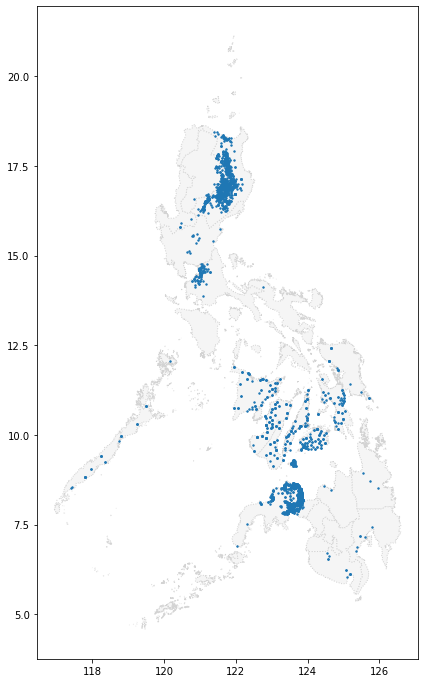

In [ ]:
# Your code here
ax = PHL.plot(figsize=(12,12), color='whitesmoke', linestyle=':', edgecolor='lightgray')
PHL_loans.plot(ax=ax, markersize=2)

# Uncomment to see a hint
#q_4.a.hint()

![image.png](https://raw.githubusercontent.com/aaubs/ds-master/main/data/Images/solution.png)

# 5. Read Starbucks locations in California and filter data for San Francisco



In [ ]:
# Load and preview Starbucks locations in California
starbucks = pd.read_csv("https://raw.githubusercontent.com/aaubs/ds-master/main/data/geopandas_data/starbucks_locations.csv")
starbucks.head()

,Store Number,Store Name,Address,City,Longitude,Latitude
0,10429-100710,Palmdale & Hwy 395,14136 US Hwy 395 Adelanto CA,Adelanto,-117.40,34.51
1,635-352,Kanan & Thousand Oaks,5827 Kanan Road Agoura CA,Agoura,-118.76,34.16
2,74510-27669,Vons-Agoura Hills #2001,5671 Kanan Rd. Agoura Hills CA,Agoura Hills,-118.76,34.15
3,29839-255026,Target Anaheim T-0677,8148 E SANTA ANA CANYON ROAD AHAHEIM CA,AHAHEIM,-117.75,33.87
4,23463-230284,Safeway - Alameda 3281,2600 5th Street Alameda CA,Alameda,-122.28,37.79


In [ ]:
# Create a geometry column from lat and lon

gdf = gpd.GeoDataFrame(starbucks, geometry=gpd.points_from_xy(starbucks.Longitude, starbucks.Latitude))
gdf

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry
0,10429-100710,Palmdale & Hwy 395,14136 US Hwy 395 Adelanto CA,Adelanto,-117.40,34.51,POINT (-117.40000 34.51000)
1,635-352,Kanan & Thousand Oaks,5827 Kanan Road Agoura CA,Agoura,-118.76,34.16,POINT (-118.76000 34.16000)
2,74510-27669,Vons-Agoura Hills #2001,5671 Kanan Rd. Agoura Hills CA,Agoura Hills,-118.76,34.15,POINT (-118.76000 34.15000)
3,29839-255026,Target Anaheim T-0677,8148 E SANTA ANA CANYON ROAD AHAHEIM CA,AHAHEIM,-117.75,33.87,POINT (-117.75000 33.87000)
4,23463-230284,Safeway - Alameda 3281,2600 5th Street Alameda CA,Alameda,-122.28,37.79,POINT (-122.28000 37.79000)
...,...,...,...,...,...,...,...
2816,14071-108147,Hwy 20 & Tharp - Yuba City,"1615 Colusa Hwy, Ste 100 Yuba City CA",Yuba City,-121.64,39.14,POINT (-121.64000 39.14000)
2817,9974-98559,"Yucaipa & Hampton, Yucaipa","31364 Yucaipa Blvd., A Yucaipa CA",Yucaipa,-117.12,34.03,POINT (-117.12000 34.03000)
2818,79654-108478,Vons - Yucaipa #1796,33644 YUCAIPA BLVD YUCAIPA CA,YUCAIPA,-117.07,34.04,POINT (-117.07000 34.04000)
2819,6438-245084,Yucaipa & 6th,"34050 Yucaipa Blvd., 200 Yucaipa CA",Yucaipa,-117.06,34.03,POINT (-117.06000 34.03000)


In [ ]:
# Check geometry column
gdf.geometry

0       POINT (-117.40000 34.51000)
1       POINT (-118.76000 34.16000)
2       POINT (-118.76000 34.15000)
3       POINT (-117.75000 33.87000)
4       POINT (-122.28000 37.79000)
                   ...             
2816    POINT (-121.64000 39.14000)
2817    POINT (-117.12000 34.03000)
2818    POINT (-117.07000 34.04000)
2819    POINT (-117.06000 34.03000)
2820    POINT (-116.40000 34.13000)
Name: geometry, Length: 2821, dtype: geometry

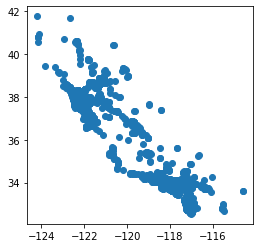

In [ ]:
# Plot data
gdf.plot()

In [ ]:
# Check explore if it does not work check missing values
gdf.explore()

TypeError: ignored

In [ ]:
gdf.shape

(2821, 7)

In [ ]:
gdf[gdf.Longitude.isnull()]

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry
153,5406-945,2224 Shattuck - Berkeley,2224 Shattuck Avenue Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
154,570-512,Solano Ave,1799 Solano Avenue Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
155,17877-164526,Safeway - Berkeley #691,1444 Shattuck Place Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
156,19864-202264,Telegraph & Ashby,3001 Telegraph Avenue Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
157,9217-9253,2128 Oxford St.,2128 Oxford Street Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY


In [ ]:
# gdf[gdf.Longitude.isnull()]['Longitude']

In [ ]:
gdf.dropna(subset=['Longitude'], inplace=True)

In [ ]:
gdf[gdf.Longitude.isnull()]

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry


In [ ]:
gdf.crs = "epsg:4326"
# SF_starbucks.set_geometry('geometry')
gdf['geometry'].to_crs(epsg='4326')

0       POINT (-117.40000 34.51000)
1       POINT (-118.76000 34.16000)
2       POINT (-118.76000 34.15000)
3       POINT (-117.75000 33.87000)
4       POINT (-122.28000 37.79000)
                   ...             
2816    POINT (-121.64000 39.14000)
2817    POINT (-117.12000 34.03000)
2818    POINT (-117.07000 34.04000)
2819    POINT (-117.06000 34.03000)
2820    POINT (-116.40000 34.13000)
Name: geometry, Length: 2816, dtype: geometry

In [ ]:
gdf.explore()

In [ ]:
gdf.City.value_counts()

San Diego        135
Los Angeles      127
San Francisco     89
San Jose          85
Sacramento        63
                ... 
Mira Loma          1
Mission Hills      1
MISSION VIEJO      1
Monterey Park      1
Yucca Valley       1
Name: City, Length: 529, dtype: int64

In [ ]:
# Filter data for San Francisco
SF_starbucks = gdf.loc[gdf['City'] == "San Francisco"].copy()
SF_starbucks.shape

(89, 7)

In [ ]:
SF_starbucks.crs = "epsg:4326"
# SF_starbucks.set_geometry('geometry')
SF_starbucks['geometry'].to_crs(epsg='4326')

2053    POINT (-122.41000 37.78000)
2054    POINT (-122.43000 37.77000)
2055    POINT (-122.40000 37.78000)
2056    POINT (-122.43000 37.78000)
2057    POINT (-122.48000 37.73000)
                   ...             
2138    POINT (-122.40000 37.78000)
2139    POINT (-122.43000 37.75000)
2140    POINT (-122.39000 37.77000)
2141    POINT (-122.40000 37.79000)
2142    POINT (-122.39000 37.79000)
Name: geometry, Length: 89, dtype: geometry

In [ ]:
# Plot data for San Francisco
SF_starbucks.explore()

![image.png](https://raw.githubusercontent.com/aaubs/ds-master/main/data/Images/solution.png)

# 6. Count the number of starbucks within each neighborhoods in San Francisco

In [ ]:
gdf_neighboor = gpd.read_file('https://raw.githubusercontent.com/aaubs/ds-master/main/data/geopandas_data/SF%20Find%20Neighborhoods.geojson')

In [ ]:
gdf_neighboor.shape

(117, 5)

In [ ]:
gdf_neighboor.head()

,link,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,None,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,None,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."


In [ ]:
gdf_neighboor.explore()

In [ ]:
SF_starbucks.head()

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry
2053,28316-250007,Teavana - San Francisco Centre,"865 Market St., #324 San Francisco CA",San Francisco,-122.41,37.78,POINT (-122.41000 37.78000)
2054,5396-1025,Church & Market - S.F.,2018 Market Street San Francisco CA,San Francisco,-122.43,37.77,POINT (-122.43000 37.77000)
2055,611-409,120 4th Street,120 4th Street San Francisco CA,San Francisco,-122.40,37.78,POINT (-122.40000 37.78000)
2056,79770-123324,Safeway - San Francisco #995,"1335 Webster, Stonestown Galleria San Francisc...",San Francisco,-122.43,37.78,POINT (-122.43000 37.78000)
2057,28323-250038,Teavana - Stonestown Galleria,"3251 20th Ave., #216 San Francisco CA",San Francisco,-122.48,37.73,POINT (-122.48000 37.73000)


In [ ]:
gdf_neighboor.head()

,link,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,None,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,None,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."


In [ ]:
starbucks_count = []
for neighborhood in gdf_neighboor['geometry']:
    starbucks = None
    starbucks = SF_starbucks[SF_starbucks.geometry.within(neighborhood)]
    starbucks_count.append(len(starbucks))

gdf_neighboor['starbucks_count'] = starbucks_count
gdf_neighboor

,link,name,geometry,starbucks_count
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",0
1,None,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872...",0
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771...",1
3,None,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710...",0
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",0
...,...,...,...,...
112,"http://en.wikipedia.org/wiki/Corona_Heights,_S...",Corona Heights,"MULTIPOLYGON (((-122.43519 37.76267, -122.4353...",0
113,http://en.wikipedia.org/wiki/Haight-Ashbury,Ashbury Heights,"MULTIPOLYGON (((-122.45196 37.76148, -122.4521...",0
114,"http://en.wikipedia.org/wiki/Eureka_Valley,_Sa...",Eureka Valley,"MULTIPOLYGON (((-122.43734 37.76235, -122.4370...",0
115,"http://en.wikipedia.org/wiki/St._Francis_Wood,...",St. Francis Wood,"MULTIPOLYGON (((-122.47157 37.73471, -122.4683...",0


In [ ]:
gdf_neighboor[gdf_neighboor['starbucks_count'] != 0]

,link,name,geometry,starbucks_count
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771...",1
7,http://www.sfgate.com/neighborhoods/sf/outerri...,Outer Richmond,"MULTIPOLYGON (((-122.51316 37.77501, -122.5026...",1
11,"http://en.wikipedia.org/wiki/Lone_Mountain,_Sa...",Lone Mountain,"MULTIPOLYGON (((-122.44728 37.78244, -122.4473...",2
14,None,Union Street,"MULTIPOLYGON (((-122.43769 37.79963, -122.4245...",2
16,http://www.sfgate.com/neighborhoods/sf/marina/,Marina,"MULTIPOLYGON (((-122.44432 37.79879, -122.4448...",1
18,http://www.sfgate.com/neighborhoods/sf/unionsq...,Downtown / Union Square,"MULTIPOLYGON (((-122.40238 37.79097, -122.4019...",8
20,"http://en.wikipedia.org/wiki/Civic_Center,_San...",Civic Center,"MULTIPOLYGON (((-122.41251 37.78048, -122.4219...",2
27,"http://en.wikipedia.org/wiki/Duboce_Triangle,_...",Duboce Triangle,"MULTIPOLYGON (((-122.43685 37.77034, -122.4286...",2
29,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Rincon Hill,"MULTIPOLYGON (((-122.38930 37.79139, -122.3888...",4
30,http://en.wikipedia.org/wiki/Neighborhoods_in_...,South Beach,"MULTIPOLYGON (((-122.38452 37.78739, -122.3843...",2


![image.png](https://raw.githubusercontent.com/aaubs/ds-master/main/data/Images/solution.png)

# 7. How far is it from Financial District to other neighborhoods?


In [ ]:
gdf_neighboor['centroid'] = gdf_neighboor.centroid

In [ ]:
gdf_neighboor.to_crs(epsg=4326,inplace=True)


In [ ]:
gdf_neighboor.geometry.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
gdf_neighboor[gdf_neighboor['name'] == 'Financial District']

,link,name,geometry,starbucks_count,centroid,dist_Financial,distance_from_previous
107,http://sanfrancisco.about.com/od/neighborhoodp...,Financial District,"MULTIPOLYGON (((-122.40296 37.79378, -122.4033...",19,POINT (-13625208.946 4207054.990),0.0,689.918115


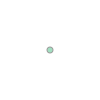

In [ ]:
gdf_neighboor['centroid'][107]

In [ ]:

gdf_neighboor['dist_Financial'] = gdf_neighboor['centroid'].distance(gdf_neighboor['centroid'][107])

In [ ]:
gdf_neighboor

,link,name,geometry,starbucks_count,centroid,dist_Financial,distance_from_previous
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",0,POINT (-13635395.795 4206407.667),10207.395444,NaN
1,None,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872...",0,POINT (-13634369.637 4206264.051),9194.772960,0.00000
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771...",1,POINT (-13632901.022 4207589.107),7710.597695,0.00000
3,None,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710...",0,POINT (-13632657.922 4206430.395),7475.117077,0.00000
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",0,POINT (-13633131.472 4205580.695),8058.534158,0.00000
...,...,...,...,...,...,...,...
112,"http://en.wikipedia.org/wiki/Corona_Heights,_S...",Corona Heights,"MULTIPOLYGON (((-122.43519 37.76267, -122.4353...",0,POINT (-13629799.166 4203915.318),5561.264716,0.00000
113,http://en.wikipedia.org/wiki/Haight-Ashbury,Ashbury Heights,"MULTIPOLYGON (((-122.45196 37.76148, -122.4521...",0,POINT (-13630971.141 4203704.057),6665.706898,354.15896
114,"http://en.wikipedia.org/wiki/Eureka_Valley,_Sa...",Eureka Valley,"MULTIPOLYGON (((-122.43734 37.76235, -122.4370...",0,POINT (-13629860.009 4203228.186),6023.023653,0.00000
115,"http://en.wikipedia.org/wiki/St._Francis_Wood,...",St. Francis Wood,"MULTIPOLYGON (((-122.47157 37.73471, -122.4683...",0,POINT (-13632859.694 4200782.511),9893.328235,2614.94011


In [ ]:
gdf_neighboor.sort_values(by = ['starbucks_count', 'dist_Financial'], ascending=False)

,link,name,geometry,starbucks_count,centroid,dist_Financial,distance_from_previous
107,http://sanfrancisco.about.com/od/neighborhoodp...,Financial District,"MULTIPOLYGON (((-122.40296 37.79378, -122.4033...",19,POINT (-13625208.946 4207054.990),0.000000,689.918115
31,http://www.sfgate.com/neighborhoods/sf/soma/,South of Market,"MULTIPOLYGON (((-122.39581 37.79115, -122.3927...",8,POINT (-13626182.761 4205477.289),1854.037665,0.000000
18,http://www.sfgate.com/neighborhoods/sf/unionsq...,Downtown / Union Square,"MULTIPOLYGON (((-122.40238 37.79097, -122.4019...",8,POINT (-13626241.547 4206535.040),1156.119889,929.158467
76,http://www.roughguides.com/travel/north-americ...,Northern Waterfront,"MULTIPOLYGON (((-122.40499 37.80383, -122.4051...",4,POINT (-13625526.122 4208036.388),1031.378905,5689.029444
29,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Rincon Hill,"MULTIPOLYGON (((-122.38930 37.79139, -122.3888...",4,POINT (-13624520.066 4206466.268),906.172595,6045.609189
...,...,...,...,...,...,...,...
49,"http://en.wikipedia.org/wiki/Nob_Hill,_San_Fra...",Lower Nob Hill,"MULTIPOLYGON (((-122.41062 37.79088, -122.4104...",0,POINT (-13627286.852 4206572.310),2133.231040,5332.721504
15,http://www.sfgate.com/neighborhoods/sf/nobhill/,Nob Hill,"MULTIPOLYGON (((-122.41062 37.79088, -122.4122...",0,POINT (-13627057.011 4207111.173),1848.919531,443.664336
105,http://www.sfgate.com/neighborhoods/sf/northbe...,North Beach,"MULTIPOLYGON (((-122.40332 37.79553, -122.4044...",0,POINT (-13626458.353 4207977.206),1552.900579,786.720722
17,"http://en.wikipedia.org/wiki/Telegraph_Hill,_S...",Telegraph Hill,"MULTIPOLYGON (((-122.40852 37.80530, -122.4053...",0,POINT (-13626114.781 4208135.738),1410.161020,1835.709690


In [ ]:
# import shapely.wkt

# utm = gdf_neighboor.estimate_utm_crs()
# gdf_neighboor.to_crs(utm).distance(gdf_neighboor.to_crs(utm))

In [ ]:
# gdf_neighboor.to_crs("EPSG:32663",inplace=True)
# gdf_neighboor['distance_from_previous'] = gdf_neighboor.distance(gdf_neighboor.shift(1))

# gdf_neighboor['distance_from_previous']

In [ ]:
# gdf_neighboor.geometry.crs

In [ ]:
# gdf_neighboor['dist_Financial'] = gdf_neighboor['centroid'].distance(gdf_neighboor['centroid'][107])

In [ ]:
df_police = gpd.read_file('/content/Police_Department_Incident_Reports__2018_to_Present.csv')

In [ ]:
df_police.head()

,field_1,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,...,Central Market/Tenderloin Boundary Polygon - Updated,Civic Center Harm Reduction Project Boundary,HSOC Zones as of 2018-06-05,Invest In Neighborhoods (IIN) Areas,Current Supervisor Districts,Current Police Districts,time_dummy,dif_time,holiday_stat,geometry
0,0,2019/03/05 09:00:00 PM,2019/03/05,21:00,2019,Tuesday,2019/03/07 12:54:00 PM,77808706372,778087,196048512,...,1.0,1.0,1.0,,10.0,5.0,Evening,3114.0,False,None
1,1,2018/12/22 12:00:00 PM,2018/12/22,12:00,2018,Saturday,2018/12/26 02:29:00 PM,75246907023,752469,180971777,...,,,,,11.0,4.0,Afternoon,5189.0,False,None
2,2,2018/08/24 05:30:00 PM,2018/08/24,17:30,2018,Friday,2018/08/24 07:35:00 PM,70675306243,706753,180639339,...,,,,,2.0,9.0,Afternoon,125.0,False,None
3,3,2018/10/20 03:10:00 PM,2018/10/20,15:10,2018,Saturday,2018/10/20 03:10:00 PM,72826462071,728264,180624631,...,,,,,10.0,1.0,Afternoon,0.0,False,None
4,4,2019/06/05 12:36:00 AM,2019/06/05,00:36,2019,Wednesday,2019/06/05 12:37:00 AM,80823030140,808230,190403077,...,,,,,3.0,6.0,Late night,1.0,False,None


In [ ]:
df_police.columns

Index(['field_1', 'Incident Datetime', 'Incident Date', 'Incident Time',
       'Incident Year', 'Incident Day of Week', 'Report Datetime', 'Row ID',
       'Incident ID', 'Incident Number', 'CAD Number', 'Report Type Code',
       'Report Type Description', 'Filed Online', 'Incident Code',
       'Incident Category', 'Incident Subcategory', 'Incident Description',
       'Resolution', 'Intersection', 'CNN', 'Police District',
       'Analysis Neighborhood', 'Supervisor District', 'Latitude', 'Longitude',
       'Point', 'Neighborhoods', 'ESNCAG - Boundary File',
       'Central Market/Tenderloin Boundary Polygon - Updated',
       'Civic Center Harm Reduction Project Boundary',
       'HSOC Zones as of 2018-06-05', 'Invest In Neighborhoods (IIN) Areas',
       'Current Supervisor Districts', 'Current Police Districts',
       'time_dummy', 'dif_time', 'holiday_stat', 'geometry'],
      dtype='object')

In [ ]:
df_police.dropna(subset=['Longitude', 'Latitude'], inplace=True)

In [ ]:
df_police['Longitude'] = pd.to_numeric(df_police['Longitude'], errors='coerce')

In [ ]:
df_police['Latitude'] = pd.to_numeric(df_police['Latitude'], errors='coerce')

In [ ]:
# df_police['Longitude'].replace(" ", '').astype(float)

In [ ]:
# df_police['Longitude'].astype('float')

In [ ]:
# Create a geometry column from lat and lon

gdf_police = gpd.GeoDataFrame(df_police, geometry=gpd.points_from_xy(df_police.Longitude, df_police.Latitude))
gdf_police = gdf_police[['field_1', 'Incident Datetime', 'Incident Date','Incident Category','Latitude', 'Longitude', 'geometry']]
gdf_police = gdf_police[gdf_police['Incident Date'].str[:4] == '2018'][:5000]
gdf_police.head()

,field_1,Incident Datetime,Incident Date,Incident Category,Latitude,Longitude,geometry
1,1,2018/12/22 12:00:00 PM,2018/12/22,Motor Vehicle Theft,37.775787,-122.427819,POINT (-122.42782 37.77579)
2,2,2018/08/24 05:30:00 PM,2018/08/24,Larceny Theft,37.723944,-122.422830,POINT (-122.42283 37.72394)
3,3,2018/10/20 03:10:00 PM,2018/10/20,Warrant,37.775161,-122.403636,POINT (-122.40364 37.77516)
6,6,2018/12/07 12:30:00 PM,2018/12/07,Other Miscellaneous,37.737170,-122.389864,POINT (-122.38986 37.73717)
7,7,2018/10/04 09:00:00 AM,2018/10/04,Burglary,37.791652,-122.404525,POINT (-122.40452 37.79165)


In [ ]:
gdf_police.shape

(5000, 7)

In [ ]:
gdf_police.set_geometry('geometry')

,field_1,Incident Datetime,Incident Date,Incident Category,Latitude,Longitude,geometry
1,1,2018/12/22 12:00:00 PM,2018/12/22,Motor Vehicle Theft,37.775787,-122.427819,POINT (-122.42782 37.77579)
2,2,2018/08/24 05:30:00 PM,2018/08/24,Larceny Theft,37.723944,-122.422830,POINT (-122.42283 37.72394)
3,3,2018/10/20 03:10:00 PM,2018/10/20,Warrant,37.775161,-122.403636,POINT (-122.40364 37.77516)
6,6,2018/12/07 12:30:00 PM,2018/12/07,Other Miscellaneous,37.737170,-122.389864,POINT (-122.38986 37.73717)
7,7,2018/10/04 09:00:00 AM,2018/10/04,Burglary,37.791652,-122.404525,POINT (-122.40452 37.79165)
...,...,...,...,...,...,...,...
11420,11420,2018/12/20 10:30:00 AM,2018/12/20,Missing Person,37.780496,-122.432140,POINT (-122.43214 37.78050)
11421,11421,2018/10/27 01:50:00 PM,2018/10/27,Fraud,37.793230,-122.393181,POINT (-122.39318 37.79323)
11423,11423,2018/09/27 02:50:00 PM,2018/09/27,Larceny Theft,37.731278,-122.498002,POINT (-122.49800 37.73128)
11424,11424,2018/08/30 01:40:00 PM,2018/08/30,Malicious Mischief,37.797089,-122.435490,POINT (-122.43549 37.79709)


In [ ]:
gdf_police.geometry

1        POINT (-122.42782 37.77579)
2        POINT (-122.42283 37.72394)
3        POINT (-122.40364 37.77516)
6        POINT (-122.38986 37.73717)
7        POINT (-122.40452 37.79165)
                    ...             
11420    POINT (-122.43214 37.78050)
11421    POINT (-122.39318 37.79323)
11423    POINT (-122.49800 37.73128)
11424    POINT (-122.43549 37.79709)
11425    POINT (-122.42140 37.79414)
Name: geometry, Length: 5000, dtype: geometry

In [ ]:
gdf_police.crs = "epsg:4326"

gdf_police.to_crs(epsg='4326')

,field_1,Incident Datetime,Incident Date,Incident Category,Latitude,Longitude,geometry
1,1,2018/12/22 12:00:00 PM,2018/12/22,Motor Vehicle Theft,37.775787,-122.427819,POINT (-122.42782 37.77579)
2,2,2018/08/24 05:30:00 PM,2018/08/24,Larceny Theft,37.723944,-122.422830,POINT (-122.42283 37.72394)
3,3,2018/10/20 03:10:00 PM,2018/10/20,Warrant,37.775161,-122.403636,POINT (-122.40364 37.77516)
6,6,2018/12/07 12:30:00 PM,2018/12/07,Other Miscellaneous,37.737170,-122.389864,POINT (-122.38986 37.73717)
7,7,2018/10/04 09:00:00 AM,2018/10/04,Burglary,37.791652,-122.404525,POINT (-122.40452 37.79165)
...,...,...,...,...,...,...,...
11420,11420,2018/12/20 10:30:00 AM,2018/12/20,Missing Person,37.780496,-122.432140,POINT (-122.43214 37.78050)
11421,11421,2018/10/27 01:50:00 PM,2018/10/27,Fraud,37.793230,-122.393181,POINT (-122.39318 37.79323)
11423,11423,2018/09/27 02:50:00 PM,2018/09/27,Larceny Theft,37.731278,-122.498002,POINT (-122.49800 37.73128)
11424,11424,2018/08/30 01:40:00 PM,2018/08/30,Malicious Mischief,37.797089,-122.435490,POINT (-122.43549 37.79709)


In [ ]:
gdf_police.dropna(subset=['geometry'], inplace=True)

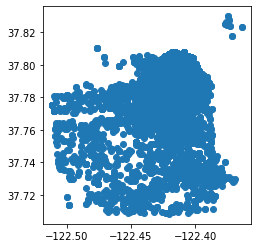

In [ ]:
gdf_police.plot()

In [ ]:
starbucks_count = []
for neighborhood in gdf_neighboor['geometry']:
    starbucks = None
    starbucks = SF_starbucks[SF_starbucks.geometry.within(neighborhood)]
    starbucks_count.append(len(starbucks))

gdf_neighboor['starbucks_count'] = starbucks_count
gdf_neighboor

In [ ]:
SF_starbucks.shape

(89, 7)

In [ ]:
gdf_neighboor.starbucks_count.sum()

82

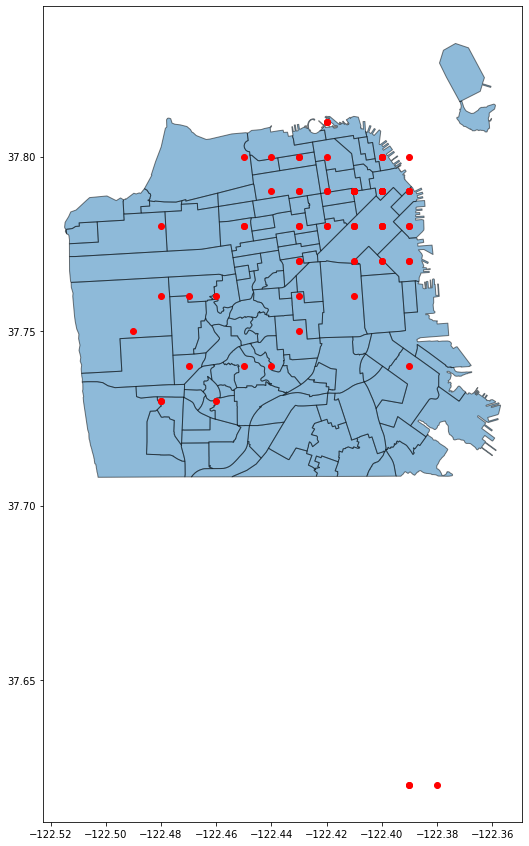

In [ ]:
ax = gdf_neighboor.plot(figsize=(10,15), alpha=0.5, edgecolor='k')
SF_starbucks.plot(ax=ax,c='r')

In [ ]:
gdf_neighboor['centroid'] = gdf.centroid

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.


In [ ]:
gdf_neighboor.plot(figsize=(10,15), alpha=0.5, edgecolor='k')
#The for loop add labels to your polygon using your centroid's coordinates
for idx, row in gdf_neighboor.iterrows():
    plt.annotate(row['name'], xy=(row['centroid'].x,row['centroid'].y), horizontalalignment='center', color = 'k')